# Assignment 5

## Question 1
### Summarizing sections 2, 3, and 4

#### Section 2

Upto this point, we know that for MCMC, we are given a sample $y_1, .. , y_n$ as well as starting parameters $\theta$. Using this information, we will sample for more values of $\theta$, which are sampled from a proposal distribution $Q(\theta_t)$. The obtained sample can be called $\theta*$.

After this sampling, we need to know whether to accept or reject this sample. For that, we will use a function $\alpha(\theta_t, \theta*)$ to make that decision. The algorithm upto this point is:

1. Draw $\theta*$ from any proposal covering the support, $Q(\theta_t)$.
2. Evaluate $\alpha = \alpha(\theta_t, \theta*) $.
4. if $\alpha = 1 $,  $\theta_{t+1}=\theta* $.
5. else $\theta_{t+1} = \theta_t $

In MH algorithm, we use a value of $\alpha$ which uses the posterior distribution. Using Barkers algorithm, we can use
$$
\alpha(\theta_t, \theta*) = \frac{\pi(\theta*) . q(\theta*, \theta_t)}{\pi(\theta*) . q(\theta*, \theta_t) + \pi(\theta_t) . q(\theta_t, \theta*)}
$$

We will represent $\pi(\theta*) . q(\theta*, \theta_t) = c_{\theta*}.p_{\theta*} $, where $c_y$ is the upper bound for $\pi(y) . q(y, x)$. The roles of $c$ is to ensure $p$ is a valid probability. 

Therefore, our $\alpha_B$ for Bakers algorithm will be:
$$
\alpha_B(\theta*, \theta_t) = \frac{c_{\theta*}.p_{\theta*}}{c_{\theta*}.p_{\theta*} + c_{\theta_t}.p_{\theta_t}}
$$

The Two Coin algorithm is used to simulate $\alpha_B$. The algorithm is as follows.

1. Draw $C_1 \sim Bern(\frac{c_{\theta*}}{c_{\theta*} + c_{\theta_t}}) $.
2. if $C_1 = 1$
    1. Draw $C_2 \sim Bern(p_{\theta*})$
    2. if $C_2 = 1$ return 1.
    3. else goto step 1.
3. if $C_1 = 0 $
    1. Draw $C_2 \sim Bern(p_{\theta_t})$
    2. if $C_2 = 1$ return 0.
    3. else goto step 1.


The computational efficiency relies heavily on upper bounds $c_{\theta*}$ and $c_{\theta_t} $.

#### Section 3

In the above mentioned two coin algorithm, there is an issue of inefficiency. The inefficiency of Barkers algorithm is due to the bernoulli factory part. Therefore, to attempt to reduce this inefficiency, we will cover Portkey algorithm.

For increasing the efficiency, let us introduce a term in the denominator, which is $d(x, y) $. From now on, I will refer to $\theta*$ as $y$ and $\theta_t$ as $x$. Therefore, our new $\alpha$ will be:
$$
\alpha(x, y) = \frac{\pi(y).q(y, x)}{\pi(y).q(y, x) + \pi(x).q(x, y) + d(x, y)}
$$

Here note, we will consider $d(x, y) = d(y, x)$.

Let us take $d(x, y) = \frac{1-\beta}{\beta}(c_x + c_y) $. Here, $0<\beta \le 1 $. To make sure the $d$ term is small, we shall set $\beta \approx 1$. Using this new value of $\alpha$, we will get the portkey method, which is computationally much more efficient. It helps in stopping some iterations which will keep on going if we have small values of $c_x$ and $c_y$. However, this is at the cost of statistical efficiency. Still, the computational efficiency outweighs all other cons. The portkey method algorithm is as follows:

1. Draw $S \sim Bern(\beta) $.
2. if $U = 0$ return 0.
3. if S = 1 then
    1. Draw $C_1 \sim Bern(\frac{c_y}{c_y + c_x}) $.
    2. if $C_1 = 1$
        1. Draw $C_2 \sim Bern(p_y)$
        2. if $C_2 = 1$ return 1.
        3. else goto step 1.
    3. if $C_1 = 0 $
        1. Draw $C_2 \sim Bern(p_x)$
        2. if $C_2 = 1$ return 0.
        3. else goto step 1.

Here, we can obtain the mean number of tries till a acceptance comes can be calculated as $s_{\beta} = (1-\beta) + \beta . \frac{c_y p_y + c_x p_x}{c_x + c_y} $. Since $0<\beta \le 1$, we can observe that $s_{\beta}$ is bounded above. Therefore, it will be computationally stable, not iterating unnecessarily long. Therefore, the portkey two coin algorithm is much more computationally efficient as compared to original two coin algorithm. 

#### Section 4

One important challenge in original two coin algorithm was obtaining a suitable value of $c_x$. However, if we take $c_x$ as lower bound of $\pi(x) . q(x, y)$, it will be easier to evaluate. The previous equation can be represented as an inverse of $\pi$ and $q$, and is as follows:
$$
\pi(x)^{-1}.q(x, y)^{-1} = \tilde{c}_x . \tilde{p}_x
$$
Using this, we can rewrite $d(x, y)$ as:
$$
d(x, y) := \tilde{d}(x, y) = \frac{1-\beta}{\beta}.\frac{\tilde{c}_x + \tilde{c}_y}{\tilde{c}_x.\tilde{p}_x.\tilde{c}_y.\tilde{p}_y}
$$



Therefore, our flipped two coin algorithm will be as follows:

1. Draw $S \sim Bern(\beta) $.
2. if $U = 0$ return 0.
3. if S = 1 then
    1. Draw $C_1 \sim Bern(\frac{\tilde{c}_y}{\tilde{c}_y + \tilde{c}_x}) $.
    2. if $C_1 = 1$
        1. Draw $C_2 \sim Bern(\tilde{p}_y)$
        2. if $C_2 = 1$ return 1.
        3. else goto step 1.
    3. if $C_1 = 0 $
        1. Draw $C_2 \sim Bern(\tilde{p}_x)$
        2. if $C_2 = 1$ return 0.
        3. else goto step 1.

In addition to the advantage of the lower bounds, we also see its advantage if generating $\tilde{p}_x$ coins is more computationally easier than $p_x$.

## Question 2

In [1]:
using Distributions
using Plots
using Pkg
using StatsBase
using StatsPlots


(process:23208): GLib-GIO-WARNING **: 00:01:05.852: Unexpectedly, UWP app `3138AweZip.AweZip_1.4.8.0_x86__ffd303wmbhcjt' (AUMId `3138AweZip.AweZip_ffd303wmbhcjt!App') supports 168 extensions but has no verbs


Upper bound function

In [2]:
function fnUpperBound(val, k)
    return k/(exp(1)*val)
end

fnUpperBound (generic function with 1 method)

Get value from weibulls distribution

In [3]:
function pGenerator(val, k, a, b, c)
    lambda = rand(Gamma(a, b))
    return (k/lambda)*(val/lambda)^(k-1)*exp(-(val/lambda)^k)/c
end

pGenerator (generic function with 1 method)

Portkey algorithm

In [4]:
function portkey(x, y, beta, k, a, b)
    c_x = fnUpperBound(x, k)
    c_y = fnUpperBound(y, k)
    count = 0
    while(true)
        count = count + 1
        s = rand(Bernoulli(beta))
        if s == 0
            return 0, count
        else
            c1 = rand(Bernoulli(c_y / (c_x + c_y) ))
            if c1 == 1
                p_y = pGenerator(y, k, a, b, c_y)
                c2 = rand(Bernoulli(p_y))
                if c2 == 1
                    return 1, count
                end
            else
                p_x = pGenerator(x, k, a, b, c_x)
                c2 = rand(Bernoulli(p_x))
                if c2 == 1
                    return 0, count
                end
            end
        end
    end
end

portkey (generic function with 1 method)

Barkers Algorithm

In [5]:
function Barkers(theta_t, beta, k, a, b)
    y = rand(Normal(theta_t, sqrt(0.001)))
    if y < 0
        return theta_t, 1
    end
    alpha, count = portkey(theta_t, y, beta, k, a, b)
    if alpha == 1
        return y, count
    else
        return theta_t, count
    end
end

Barkers (generic function with 1 method)

Running the barkers algorithm and obtaining samples

In [6]:
function fullAlgo(beta)
    a = 10
    b = 100

    lambda = rand(Gamma(a, b))
    k = 10


    # data = zeros(1000)
    # for i in 1:1000
    #     data[i] = rand(Weibull(k, lambda))
    # end
    theta0 = rand(Weibull(k, lambda))#mean(data)
    samples = zeros(10_000)
    samples[1] = theta0
    loops = zeros(10_000)
    loops[1] = 1
    accept = 1
    for i in 2:10_000
        samples[i], loops[i] = Barkers(samples[i-1], beta, k, a, b)
        if samples[i] != samples[i-1] 
            accept = accept + 1
        end
    end
    println("The acceptance ratio is: ",accept/10_000)
    return loops, samples
end

fullAlgo (generic function with 1 method)

When $\beta = 0.99$

The acceptance ratio is: 0.4896

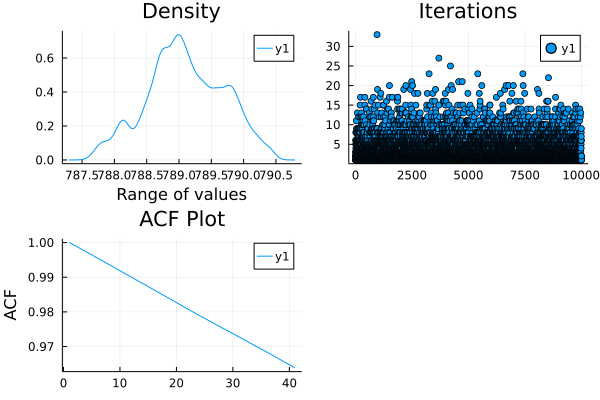

In [7]:
loops, samples = fullAlgo(0.99)
p1 = density(samples, title="Density", xlabel="Range of values")
p2 = plot(loops, title="Iterations", seriestype = :scatter)
p3 = plot(autocor(samples), ylabel="ACF",title="ACF Plot")
plot(p1, p2, p3)

When $\beta = 1$

The acceptance ratio is: 0.4964


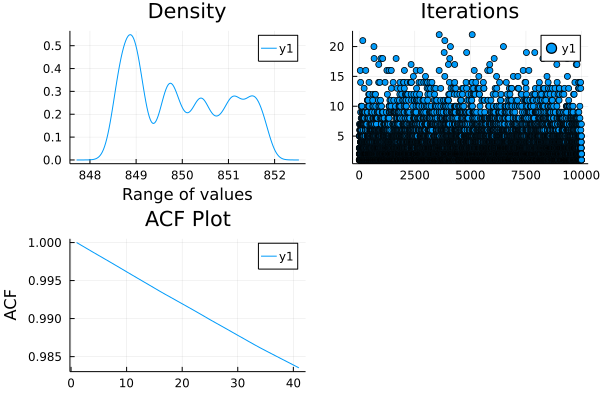

In [8]:
loops, samples = fullAlgo(1)
p1 = density(samples, title="Density", xlabel="Range of values")
p2 = plot(loops, title="Iterations", seriestype = :scatter)
p3 = plot(autocor(samples), ylabel="ACF",title="ACF Plot")
plot(p1, p2, p3)

When $\beta = 0.9$

The acceptance ratio is: 0.352


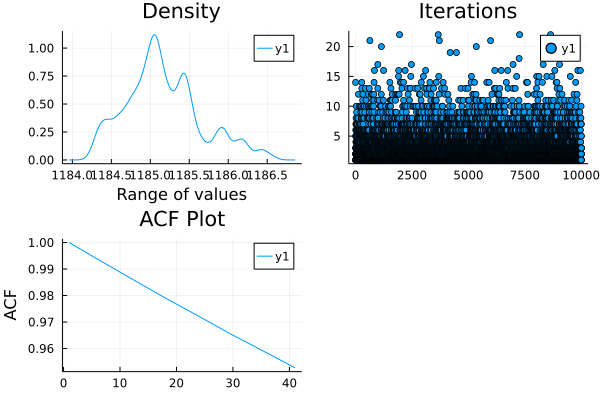

In [9]:
loops, samples = fullAlgo(0.9)
p1 = density(samples, title="Density", xlabel="Range of values")
p2 = plot(loops, title="Iterations", seriestype = :scatter)
p3 = plot(autocor(samples), ylabel="ACF",title="ACF Plot")
plot(p1, p2, p3)

When $\beta=0.5$

The acceptance ratio is: 0.1184


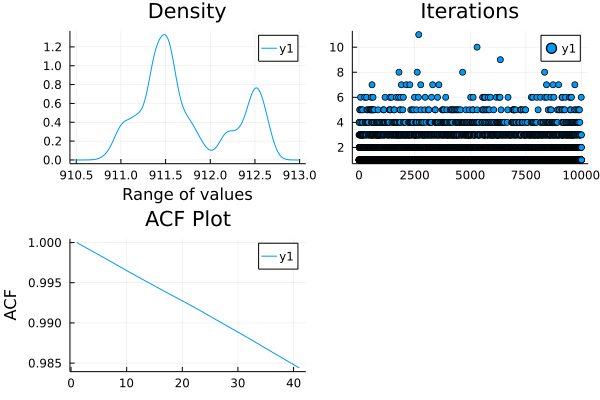

In [10]:
loops, samples = fullAlgo(0.5)
p1 = density(samples, title="Density", xlabel="Range of values")
p2 = plot(loops, title="Iterations", seriestype = :scatter)
p3 = plot(autocor(samples), ylabel="ACF",title="ACF Plot")
plot(p1, p2, p3)